<a href="https://colab.research.google.com/github/abyanjan/Object-Detection-with-Pytorch/blob/master/Object_Detection_with_Pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## OBJECT DETECTION WITH PRETRAINED MODELS AND PYTORCH

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import cv2

from torchvision.models import detection
import torch
from google.colab.patches import cv2_imshow

In [2]:
# set the device to use by the model
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [4]:
# load the coco class labels
with open('/content/coco_classes.pickle', 'rb') as f:
  LABELS = pickle.load(f)

print(f'Number of Classes: {len(LABELS)}')

Number of Classes: 91


### DEFINE FUNCTION TO MAKE DETECTION

In [72]:
def make_detection(image_path, model):

  # read image and convert to RGB
  image = cv2.imread(image_path)
  # make a copy of the original image
  orig_img = image.copy()

  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  # image from channels last to channels first ordering
  image = image.transpose((2, 0, 1))

  # add batch dimension and convert to float tensors
  image = np.expand_dims(image, axis = 0)
  image = image/255.0
  image = torch.FloatTensor(image)

  # set the input image to device
  image = image.to(DEVICE)

  # load the model and set it to evaluation mode
  model = model(pretrained=True, progress=True,num_classes = len(LABELS),
                pretrained_backbone = True).to(DEVICE)
  model.eval()
  # get the detections
  detections = model(image)

  return orig_img, detections

### FUNCTION TO SHOW THE DETECTIONS

In [86]:
def show_detections(image, detections, confidence_threshold=0.5):
  detections = detections[0]
  #loop over all the detections
  for i in range(0, len(detections['boxes'])):
    # extract the confidence asscociated with the prediction
    confidence = detections['scores'][i]

    # filter out weak predictions
    if confidence > confidence_threshold:
      # get the class labels and bounding box
      label_idx = detections['labels'][i]
      box = detections['boxes'][i].detach().cpu().numpy()
      (startX, startY, endX, endY) = box.astype('int')

      # create a text to display
      label = f'{LABELS[label_idx]}:{confidence*100 : .1f}'

      # create colors for the different labels
      COLORS = np.random.uniform(0, 255, size=(len(LABELS), 3))

      # draw the bounding box
      cv2.rectangle(image, (startX, startY),(endX, endY), COLORS[label_idx],2)
      # put the text for class detected
      y = startY - 15 if startY - 15 > 15 else startY + 15
      cv2.putText(image, label, (startX, y), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                  COLORS[label_idx], 2)

  # show the image
  cv2_imshow(image)
  #plt.axis('off')
  #plt.show()

  

## DETECTION WITH FASTER RCNN AND RESNET

In [105]:
MODEL = detection.fasterrcnn_resnet50_fpn

**EXAMPLE 1**

In [106]:
orig_img, detections = make_detection(image_path='image1.png', model = MODEL)

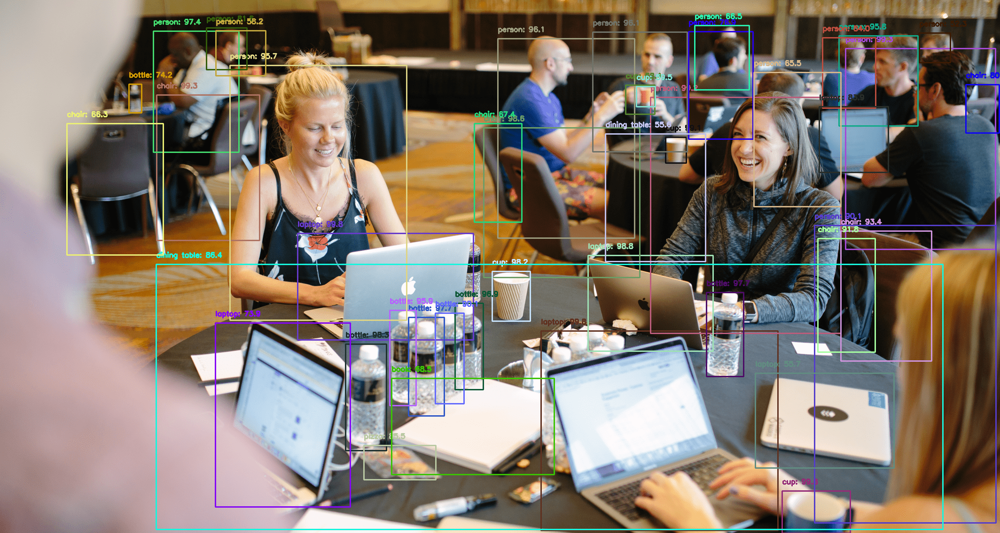

In [107]:
show_detections(orig_img, detections)

**EXAMPLE 2**

In [108]:
orig_img, detections = make_detection(image_path='image2.jpg', model = MODEL)

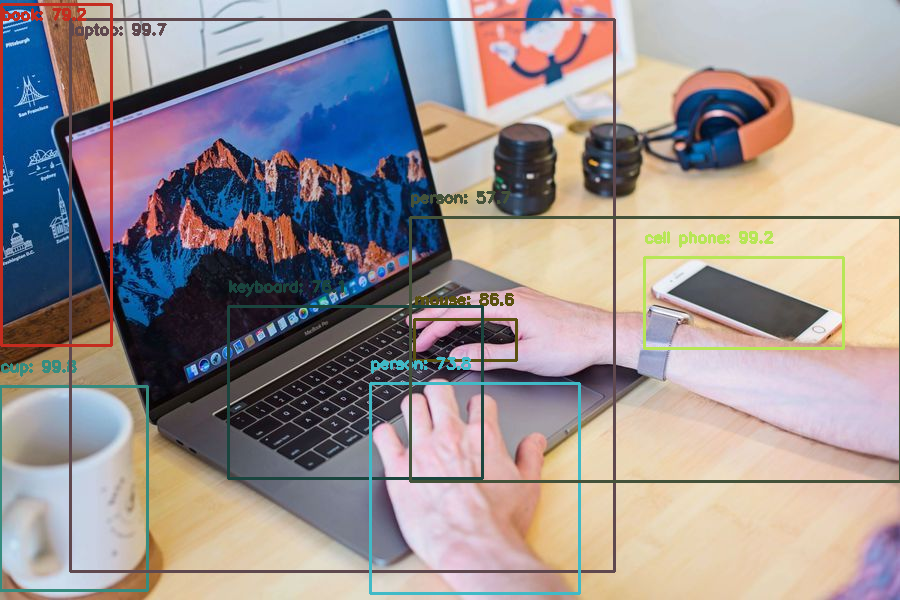

In [109]:
show_detections(orig_img, detections)

**EXAMPLE 3**

In [110]:
orig_img, detections = make_detection(image_path='image3.jpg', model = MODEL)

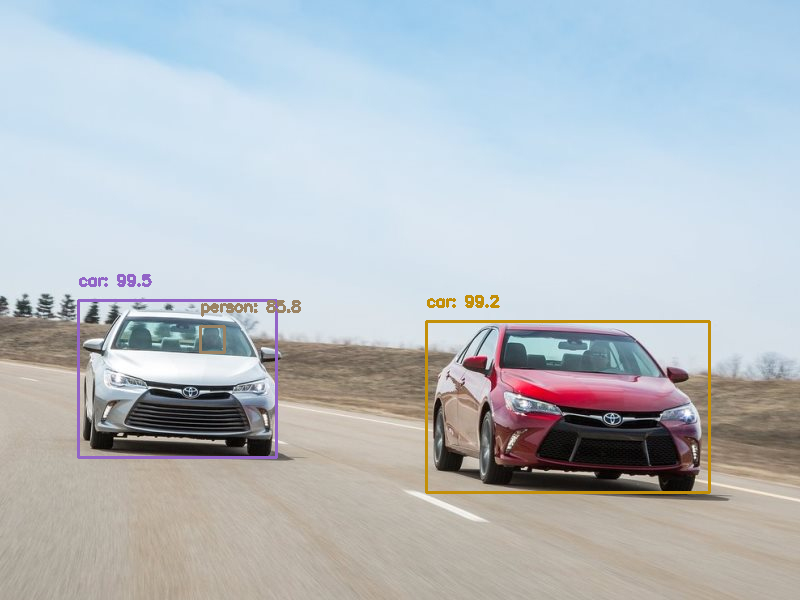

In [111]:
show_detections(orig_img, detections)

**EXAMPLE 4**

In [112]:
orig_img, detections = make_detection(image_path='image4.jpg', model = MODEL)

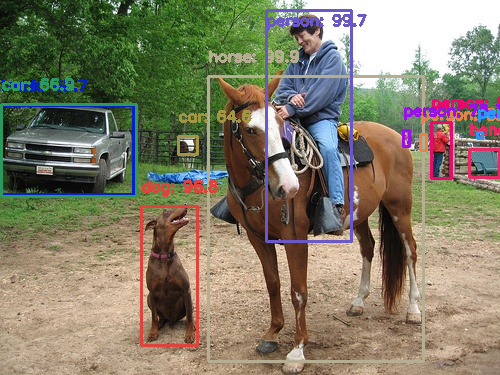

In [113]:
show_detections(orig_img, detections)

## DETECTION WITH FAST RCNN AND MOBILENET

In [87]:
MODEL = detection.fasterrcnn_mobilenet_v3_large_320_fpn

**EXAMPLE 1**

In [88]:
orig_img, detections = make_detection(image_path='image1.png', model = MODEL)

Downloading: "https://download.pytorch.org/models/fasterrcnn_mobilenet_v3_large_320_fpn-907ea3f9.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_mobilenet_v3_large_320_fpn-907ea3f9.pth


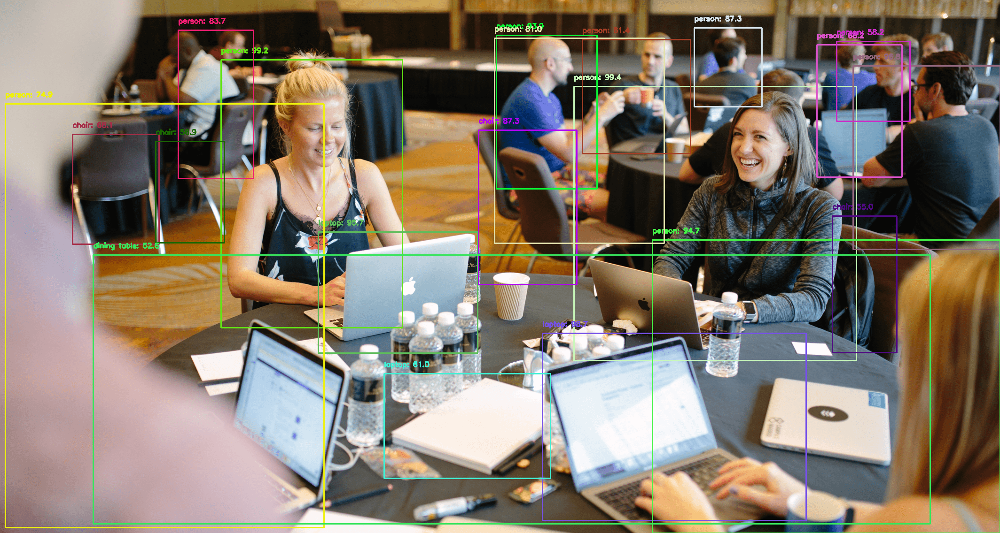

In [89]:
show_detections(orig_img, detections)

**EXAMPLE 2**

In [90]:
orig_img, detections = make_detection(image_path='image2.jpg', model = MODEL)

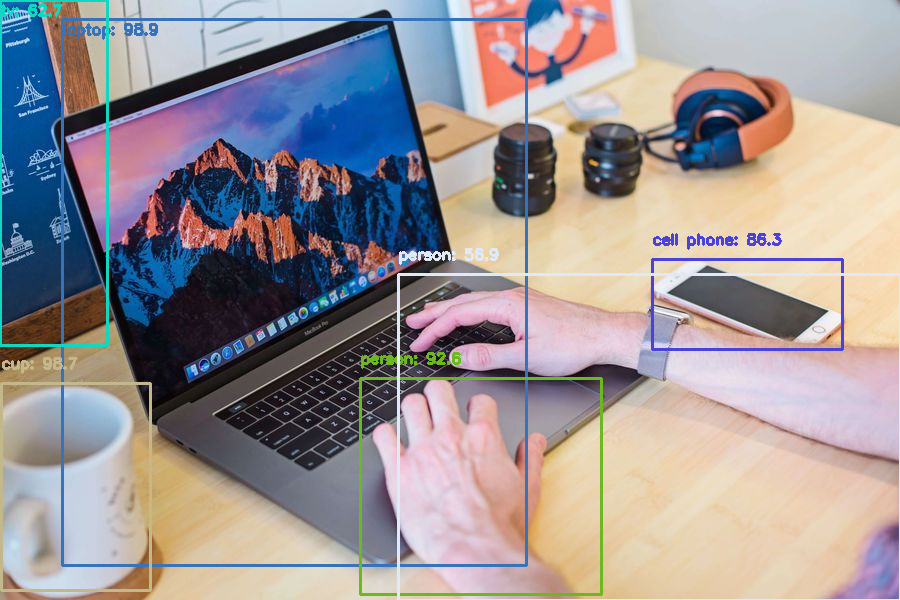

In [91]:
show_detections(orig_img, detections)

**EXAMPLE 3**

In [92]:
orig_img, detections = make_detection(image_path='image3.jpg', model = MODEL)

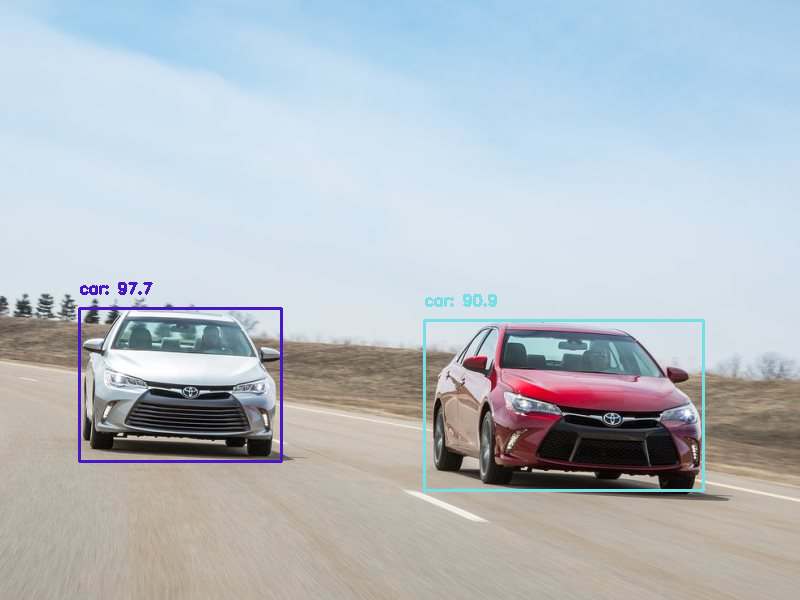

In [93]:
show_detections(orig_img, detections)

**EXAMPLE 4**

In [94]:
orig_img, detections = make_detection(image_path='image4.jpg', model = MODEL)

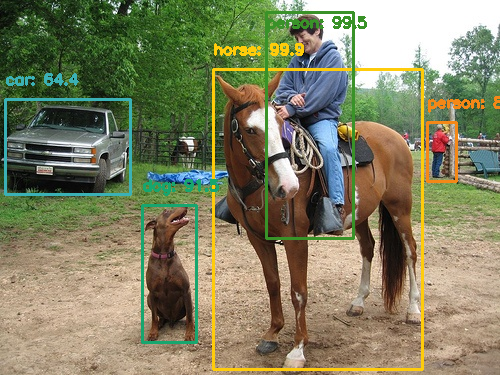

In [95]:
show_detections(orig_img, detections)

## DETECTION WITH RETINANET AND RESNET

In [96]:
MODEL = detection.retinanet_resnet50_fpn

**EXAMPLE 1**

In [97]:
orig_img, detections = make_detection(image_path='image1.png', model = MODEL)

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_coco-eeacb38b.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_coco-eeacb38b.pth


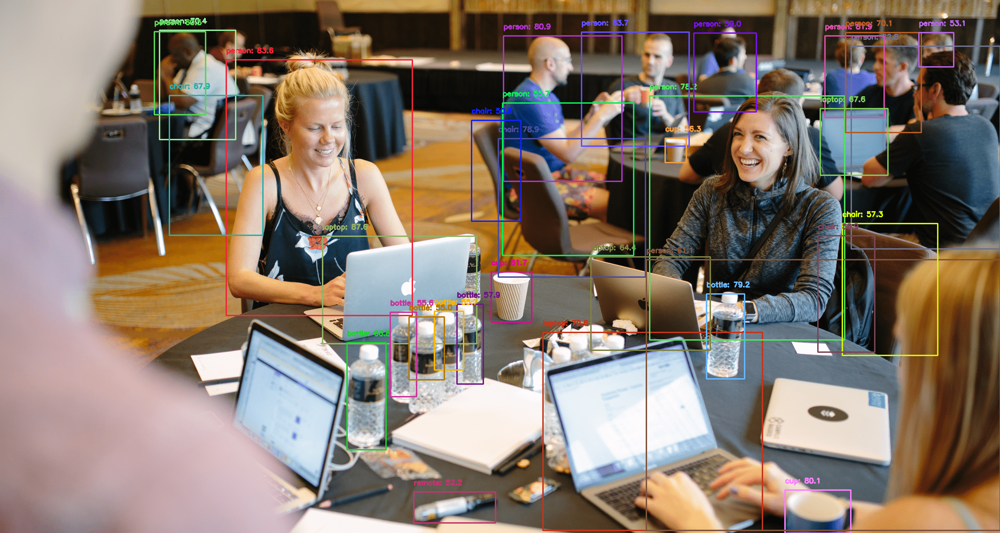

In [98]:
show_detections(orig_img, detections)

**EXAMPLE 2**

In [99]:
orig_img, detections = make_detection(image_path='image2.jpg', model = MODEL)

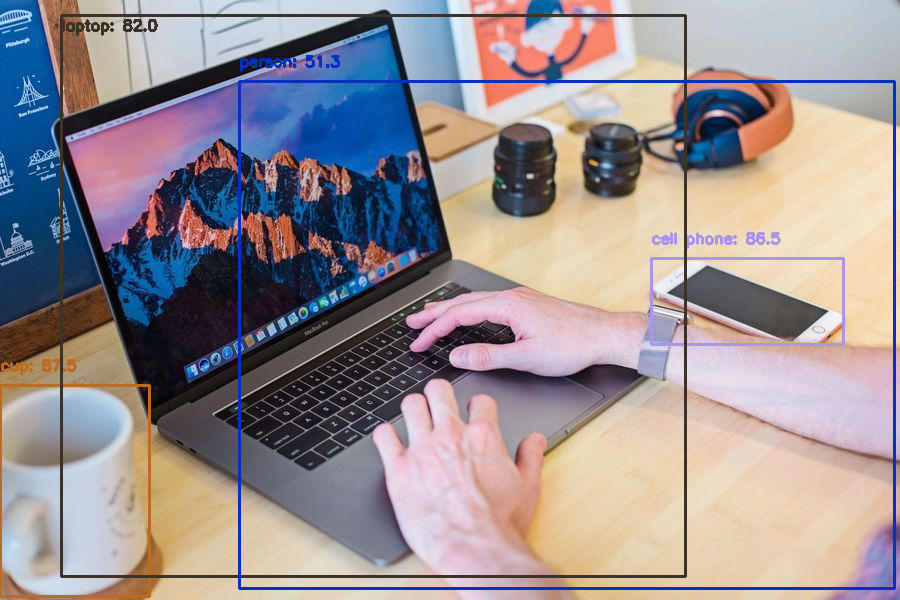

In [100]:
show_detections(orig_img, detections)

**EXAMPLE 3**

In [101]:
orig_img, detections = make_detection(image_path='image3.jpg', model = MODEL)

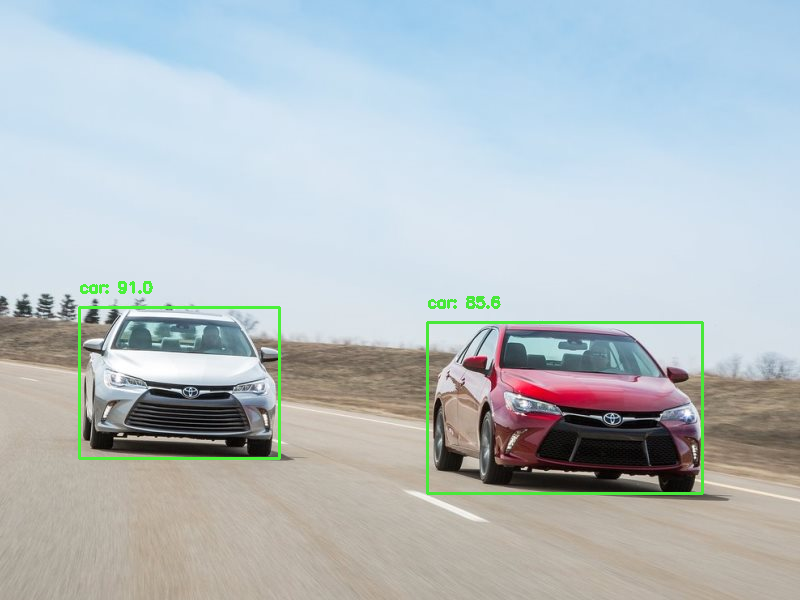

In [102]:
show_detections(orig_img, detections)

**EXAMPLE 4**

In [103]:
orig_img, detections = make_detection(image_path='image4.jpg', model = MODEL)

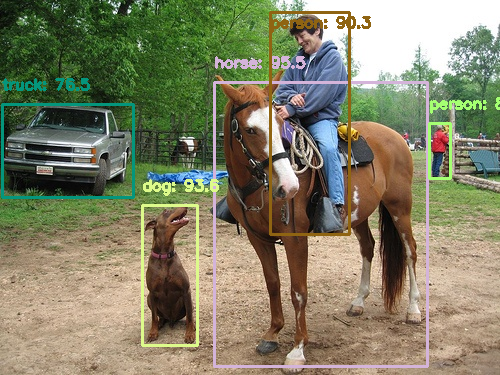

In [104]:
show_detections(orig_img, detections)

In [ ]:
#!wget -O image1.png https://buffer.com/resources/content/images/resources/wp-content/uploads/2018/11/free-images-featured.png 

In [ ]:
#!wget -O image2.jpg https://imagekit.io/blog/content/images/2019/12/image-optimization.jpg